In [1]:
import pandas as pd
import networkx as nx
import numpy as np
import datetime as dt
from matplotlib import pyplot as plt

%matplotlib inline

In [100]:
# Датасет - Мошенникик
fraud = pd.read_excel(r'./Мошенники.xlsx', dtype=str)
# Преобразуем даты
fraud['Date_start'] = pd.to_datetime(fraud['Date_start'])
fraud['Date_end'] = pd.to_datetime(fraud['Date_end'])


# Датасет с Клиенты
clients = pd.read_excel(r'./Сессии.xlsx', dtype=str)
# Преобразуем даты
clients['Date_start'] = pd.to_datetime(clients['Date_start'])
clients['Date_end'] = pd.to_datetime(clients['Date_end'])

#### Описание данных

* index - id клиента / мошенника
* numbers - номер телефона
* Date_start - начало периода активности
* Date_end - окончание периода активности

In [101]:
# Выводим сэмпл данных по мошенникам
fraud.sample(5)

,index,numbers,Date_start,Date_end
743,1505,+30 455-488-4751,2023-02-17,2023-06-15
343,660,+594 430-309-4615,2021-12-18,2022-02-16
931,513,+684 182-999-9264,2022-10-08,2022-12-25
281,1294,+266 723-496-6716,2022-10-28,2023-01-16
264,379,+44 139-156-5673,2021-11-20,2022-07-05


In [102]:
# Выводим сэмпл данных по клиентам
clients.sample(5)

,index,numbers,Date_start,Date_end
1542,1252,+21 174-920-8859,2023-01-17,2023-03-25
689,1546,+212 646-976-3916,2021-10-06,2022-08-30
3389,1658,+222 339-661-9709,2022-04-01,2022-05-10
1903,1887,+266 106-183-4501,2022-05-06,2022-09-30
2079,2738,+502 794-618-4086,2022-08-31,2023-05-19


In [103]:
# Функция для получения массива с цветами узлов
def take_color(graph: nx.Graph, key_for_color: str='color')->np.array:
    color = [graph.nodes[node][key_for_color] for node in graph.nodes]
    return np.array(color)

# Функция для получения массива с размерами узлов
def take_size(graph: nx.Graph, key_for_size: str='size')->np.array:
    size = [graph.nodes[node][key_for_size] for node in graph.nodes]
    return np.array(size)

In [104]:
# Глобальные переменные
color_for_cl = '#9ACD32'
color_for_f = '#FF6347'
color_for_ph_f = '#FFD700'
color_for_ph = '#7FFFD4'


size_for_ph = 500
size_for_ph_f = 500
size_for_cl = 1000
size_for_f = 1000


group_for_cl = 1
group_for_f = 10
group_for_ph = 200
group_for_ph_f = 201

In [269]:
# Создаем граф
graph = nx.Graph()

# Добавляем ребра
edge = [(int(clients.iat[i, 0]), clients.iat[i, 1]) for i in clients.index]
graph.add_edges_from(edge, weight=1.5, size=1000)

In [270]:
# Добавляем атрибуты "Даты активности" и настраиваем вершины графа
for i in clients.index:
    cl = clients.at[i, 'index']
    id_ph = clients.at[i, 'numbers']
    date_st = clients.at[i, 'Date_start']
    date_end = clients.at[i, 'Date_end']
    
    graph.nodes[int(cl)]['color'] = color_for_cl
    graph.nodes[int(cl)]['size'] = size_for_cl
    graph.nodes[int(cl)]['group'] = group_for_cl
    
    graph.nodes[id_ph]['color'] = color_for_ph
    graph.nodes[id_ph]['size'] = size_for_ph
    graph.nodes[id_ph]['group'] = group_for_ph

    graph.nodes[id_ph]['date_start'] = date_st
    graph.nodes[id_ph]['date_end'] = date_end

In [200]:
# применяем раскладку для графа
pos = nx.fruchterman_reingold_layout(graph, iterations=10)

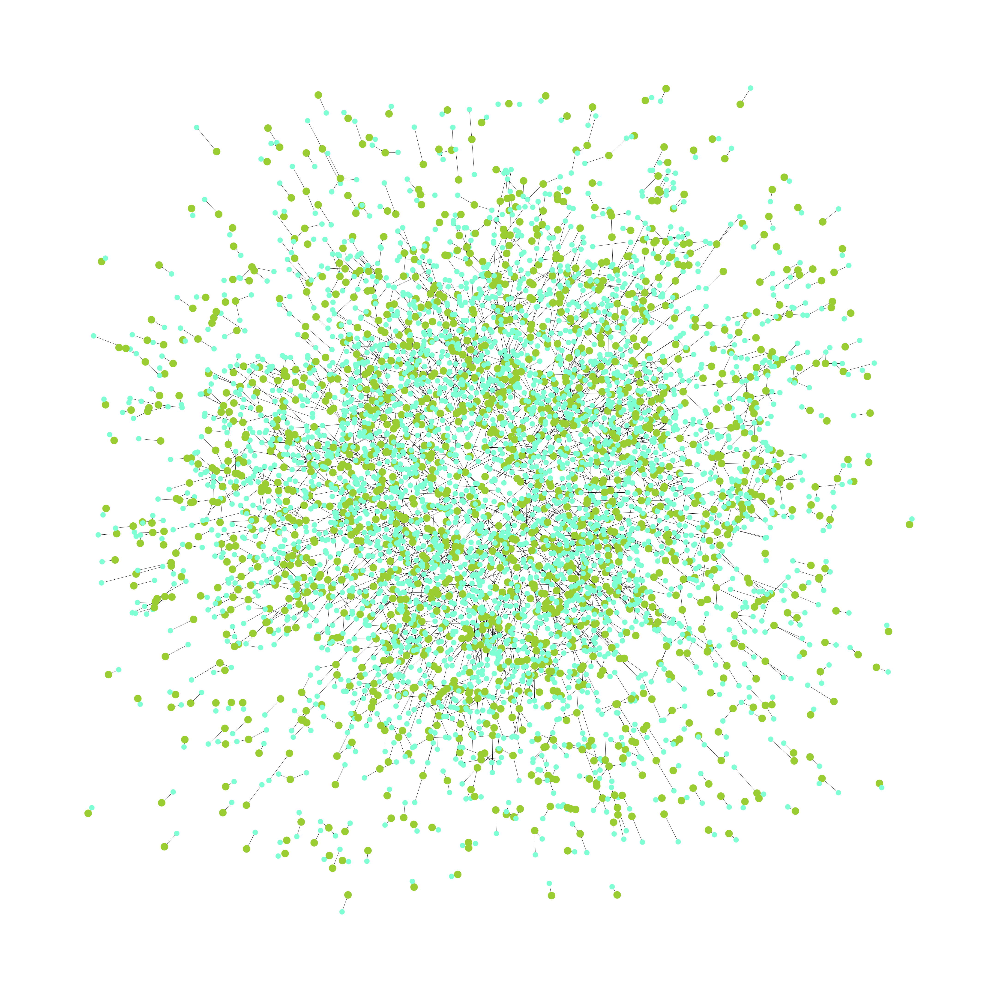

In [273]:
# Размер листа
plt.rcParams.update({
    'figure.figsize': (60, 60)})

# Рисуем граф
nx.draw(graph,
        pos=pos,
        with_labels = False,
        node_color = take_color(graph),
        node_size = take_size(graph),       
       )

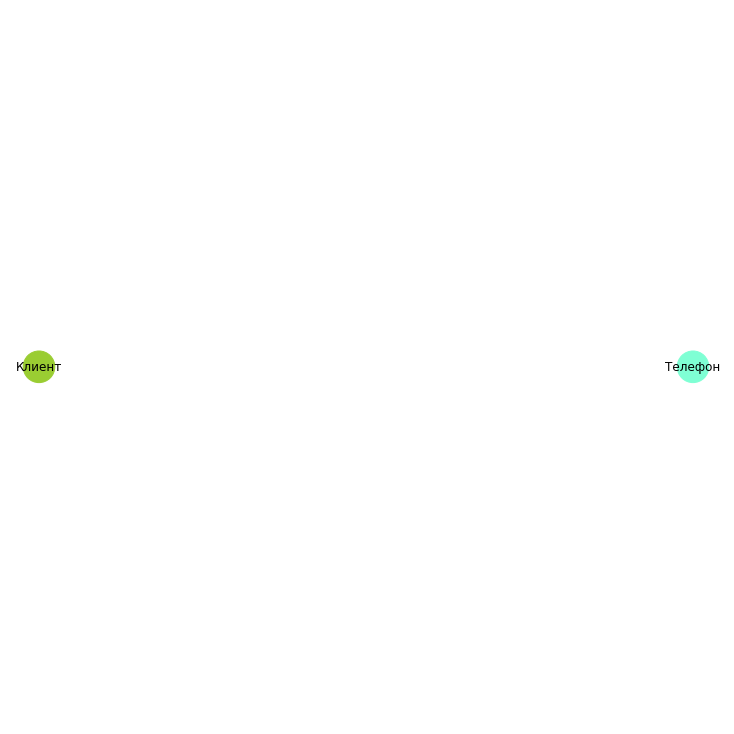

In [268]:
# Создаем легенду для графа
legend = nx.Graph()
legend.add_node('Клиент', color=color_for_cl)
legend.add_node('Телефон', color=color_for_ph)

plt.rcParams.update({
    'figure.figsize': (10, 10)})

pos_legend = {'Клиент': np.array([0.499999999999999, 1]),
              'Телефон':np.array([0.500000000000045, 1])
             }

nx.draw(legend,
        pos = pos_legend,
        with_labels = True,
        node_color = take_color(legend),
        node_size = 1000
       )

In [276]:
# Создаем список подграфов
sub_cc = [graph.subgraph(sub).copy() for sub in nx.connected_components(graph)]

print(f"В нашем графе содержится {len(sub_cc)} подграфа")

# Создаем DataFrame с подграфами и их размерами,
# сортируем так чтобы самый большой подграф - 1
sub_cc = pd.DataFrame().from_dict({ sub: len(sub) for sub in sub_cc},
                                    orient='index',
                                    columns=['len_sub'])\
                        .sort_values('len_sub', ascending=False)\
                        .reset_index()

В нашем графе содержится 1716 подграфа


In [277]:
sub_cc.head(5)

,index,len_sub
0,"(+674 767-490-1355, +377 613-501-8179, +501 ...",9
1,"(+238 793-459-8225, +599 385-833-9928, +32 ...",9
2,"(514, +688 511-803-7421, +505 192-860-4880, ...",8
3,"(+62 312-128-4942, +262 263-795-6429, +852 ...",8
4,"(+965 806-453-7584, 2502, +7 537-187-8876, +...",7


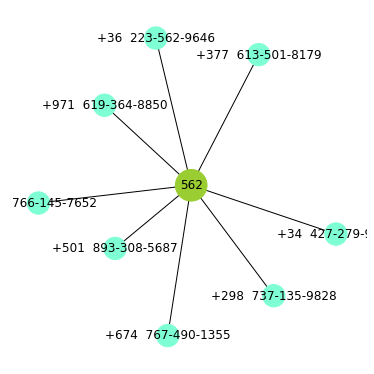

In [279]:
# Достаем подграф из DataFrame
sub = sub_cc['index'][0]
sub = nx.subgraph(graph, sub)

# Размер листа
plt.rcParams.update({
    'figure.figsize': (5, 5)})

# применяем раскладку для графа
pos = nx.fruchterman_reingold_layout(sub, iterations=10)

# Рисуем граф
nx.draw(sub,
        pos=pos,
        with_labels = True,
        node_color = take_color(sub),
        node_size = take_size(sub),       
       )

In [181]:
fraud.head(3)

,index,numbers,Date_start,Date_end
0,328,+63 405-978-4153,2021-10-17,2023-01-24
1,1992,+221 554-814-7187,2022-02-16,2023-03-24
2,1772,+30 184-676-7886,2022-12-31,2023-01-19


In [282]:
# Реализуем алгоритм выявления связей
for i in range(len(fraud)):
    id_ph = fraud.at[i, "numbers"]
    fr = int(fraud.at[i, "index"])
    if id_ph not in graph.nodes:
        continue
    date_start = graph.nodes[id_ph]['date_start']
    date_end = graph.nodes[id_ph]['date_end']
    date_start_f = fraud.at[i, 'Date_start']
    date_end_f = fraud.at[i, 'Date_end']
    
#   Проверяем условие пересечения периодов   
    if (date_start <= date_start_f <= date_end) or\
                          (date_start <= date_end_f <= date_end):
        
        graph.add_edge(id_ph, int(fr), weight=1.5, size=1000)
        
        graph.nodes[int(fr)]['color'] = color_for_f
        graph.nodes[int(fr)]['size'] = size_for_f
        graph.nodes[int(fr)]['group'] = group_for_f
                          
        graph.nodes[id_ph]['color'] = color_for_ph_f
        graph.nodes[id_ph]['size'] = size_for_ph_f
        graph.nodes[id_ph]['group'] = group_for_ph_f


In [293]:
# применяем раскладку для графа
pos = nx.fruchterman_reingold_layout(graph, iterations=10)

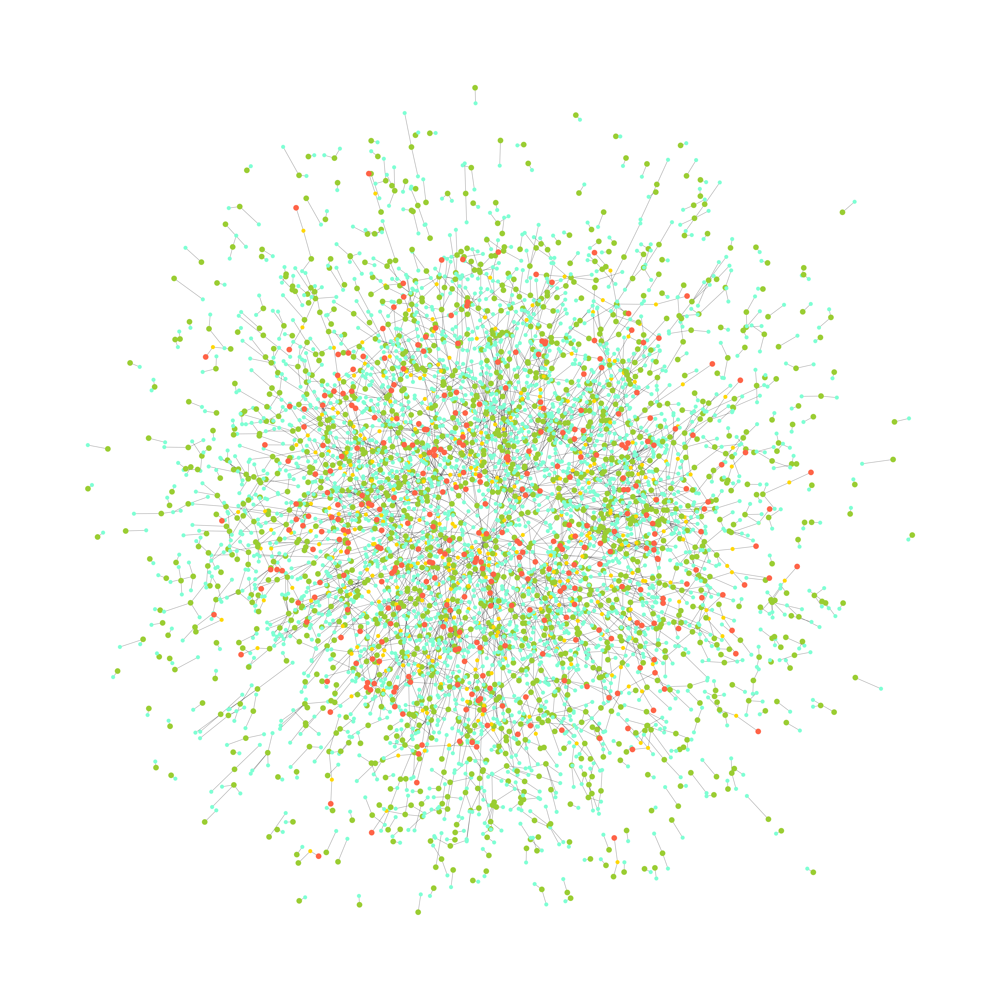

In [294]:
# Размер листа
plt.rcParams.update({
    'figure.figsize': (80, 80)})

# Рисуем граф
nx.draw(graph,
        pos=pos,
        with_labels = False,
        node_color = take_color(graph),
        node_size = take_size(graph),       
       )

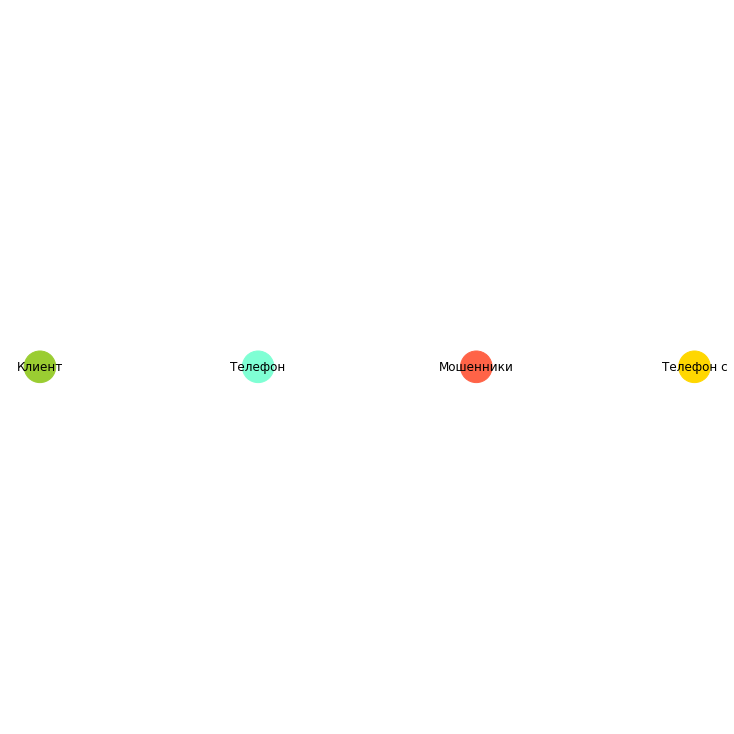

In [303]:
# Создаем легенду для графа
legend = nx.Graph()
legend.add_node('Клиент', color=color_for_cl)
legend.add_node('Телефон', color=color_for_ph)
legend.add_node('Мошенники', color=color_for_f)
legend.add_node('Телефон с', color=color_for_ph_f)


plt.rcParams.update({
    'figure.figsize': (10, 10)})

pos_legend = {'Клиент': np.array([0, 1]),
              'Телефон':np.array([0.5, 1]),
              'Мошенники':np.array([1, 1]),
              'Телефон с':np.array([1.5, 1])
             }

nx.draw(legend,
        pos = pos_legend,
        with_labels = True,
        node_color = take_color(legend),
        node_size = 1000
       )

In [285]:
# Создаем список подграфов
sub_cc = [graph.subgraph(sub).copy() for sub in nx.connected_components(graph)]

print(f"В нашем графе содержится {len(sub_cc)} подграфа")

# Создаем DataFrame с подграфами и их размерами,
# сортируем так что самы большой подграф - 1
sub_cc = pd.DataFrame().from_dict({ sub: len(sub) for sub in sub_cc},
                                    orient='index',
                                    columns=['len_sub'])\
                        .sort_values('len_sub', ascending=False)\
                        .reset_index()

В нашем графе содержится 1688 подграфа


In [286]:
sub_cc.head(5)

,index,len_sub
0,"(+672 491-184-1215, +247 169-114-2561, 644, ...",21
1,"(+357 349-959-8305, +506 940-775-4800, +378 ...",15
2,"(+592 109-586-8762, 1312, +964 214-463-8215,...",13
3,"(1088, +39 501-871-4529, +27 688-558-2770, +...",12
4,"(+43 621-729-8871, +253 323-751-9046, +224 ...",12


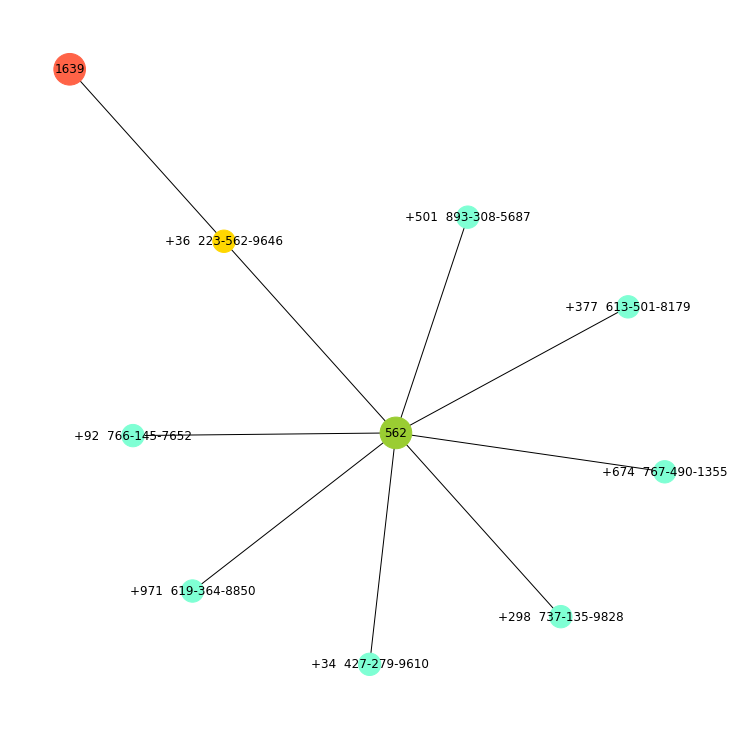

In [290]:
# Достаем подграф из DataFrame
sub = sub_cc['index'][0]
sub = nx.subgraph(graph, sub)

# Размер листа
plt.rcParams.update({
    'figure.figsize': (10, 10)})

# применяем раскладку для графа
pos = nx.kamada_kawai_layout(sub)

# Рисуем граф
nx.draw(sub,
        pos=pos,
        with_labels = True,
        node_color = take_color(sub),
        node_size = take_size(sub),       
       )

In [289]:
# Находим подграф с узлом из 1 блока
for i in sub_cc.index:
    if 562 in sub_cc['index'][i]:
        sub = sub_cc['index'][i]
        break